### Precision-Recall Estimate HSDM DATA ###

In [1]:
import sys
import os
import random
import numpy as np
import json
import copy
import glob
import pandas as pd
import logging
from pathlib import Path
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle
from sklearn import metrics as skmetrics
import seaborn as sns

logger = logging.getLogger(__name__)

# PyTorch
import torch
from torchvision import ops

%load_ext autoreload
%autoreload 2
import computervision
from computervision.imageproc import is_image, ImageData, clipxywh, xyxy2xywh, xywh2xyxy, plot_boxes
from computervision.datasets import DETRdataset
from computervision.transformations import AugmentationTransform
from computervision.performance import DetectionMetrics
from computervision.inference import DETRinference, get_gpu_info

print(f'Project version: {computervision.__version__}')
print(f'Authors: {computervision.__authors__}')
print(f'Python version:  {sys.version}')

Project version: v0.0.2
Authors: The Core for Computational Biomedicine at Harvard Medical School
https://dbmi.hms.harvard.edu/about-dbmi/core-computational-biomedicine
Python version:  3.12.3 (main, Jun 18 2025, 17:59:45) [GCC 13.3.0]


In [2]:
# Check GPU availability
device, device_str = get_gpu_info()

CUDA available: True
Number of GPUs found:  1
Current device ID: 0
GPU device name:   NVIDIA GeForce RTX 3060 Laptop GPU
PyTorch version:   2.8.0a0+34c6371d24.nv25.08
CUDA version:      13.0
CUDNN version:     91200
Current device:    cuda:0


### Test data ###

In [3]:
# Test data
data_dir = os.environ.get('DATA')
dataset_name = 'dataset_object_240921'
image_dir = os.path.join(data_dir, dataset_name)
test_df_file_name = 'objectdata_240921_clean_ide_dset.parquet'
test_df_file = os.path.join(image_dir, test_df_file_name)
df = pd.read_parquet(test_df_file)

# Filter the data frame
dset_col = 'dset'
label_col = 'pos'
file_col = 'file_name'
bbox_col = 'bbox'
score_col = 'score'

df = df.loc[(df[dset_col].isin(['val', 'test']))]
display(df.head(2))
print(f'Images in test data: {len(df[file_col].unique())}')
print(f'Annotations:         {df.shape[0]}')

,file_name,width,height,bbox,pos,disease,dset
0,0060bce2_20210430_02.png,1200,854,"[204, 0, 620, 443]",14,unstable,val
1,0060bce2_20210430_02.png,1200,854,"[715, 409, 485, 445]",18,stable,val


Images in test data: 639
Annotations:         1129


### Compare model recall on HSDM data ###

In [8]:
output_dir = os.path.join(os.environ['DATA'], 'output')
recall_files = sorted(glob.glob(os.path.join(output_dir, '*_hsdm_RECALL.parquet')))
print(recall_files)

result_df_list = []
for file in recall_files:
    result_df_list.append(pd.read_parquet(file))
result_df = pd.concat(result_df_list, axis=0, ignore_index=True)
display(result_df.head())

['/app/data_model/output/rtdetr_dtx_251012_08_hsdm_RECALL.parquet', '/app/data_model/output/rtdetr_dtx_hsdm_251014_01_hsdm_RECALL.parquet', '/app/data_model/output/rtdetr_dtx_rbf_hsdm_251016_01_hsdm_RECALL.parquet', '/app/data_model/output/rtdetr_dtx_rbf_hsdm_251018_02_hsdm_RECALL.parquet', '/app/data_model/output/rtdetr_dtx_rbf_hsdm_251018_03_hsdm_RECALL.parquet']


,model,checkpoint,score_threshold,pos,n_true_images,total_preds,mulitples,TP,FN,recall
0,rtdetr_dtx_251012_08,19600,0.02,2,38,223,185,38,0,1.000
1,rtdetr_dtx_251012_08,19600,0.03,2,38,223,185,38,0,1.000
2,rtdetr_dtx_251012_08,19600,0.04,2,38,223,185,38,0,1.000
3,rtdetr_dtx_251012_08,19600,0.05,2,38,223,185,38,0,1.000
4,rtdetr_dtx_251012_08,19600,0.06,2,38,127,89,36,2,0.947


In [41]:
metric = 'recall'
label_list = sorted(list(result_df['pos'].unique()))

data_metric = result_df[['model', 'checkpoint', 'score_threshold', metric]].\
    groupby(['model', 'checkpoint', 'score_threshold']).mean().\
    reset_index(drop=False).\
    sort_values(by=['checkpoint', 'score_threshold'], ascending=True).\
    reset_index(drop=True)

data_metric = data_metric.assign(score=data_metric['score_threshold'].round(decimals=3))
display(data_metric.sample(5))

,model,checkpoint,score_threshold,recall,score
84,rtdetr_dtx_hsdm_251014_01,4512,0.38,0.000000,0.38
73,rtdetr_dtx_hsdm_251014_01,4512,0.27,0.011355,0.27
594,rtdetr_dtx_rbf_hsdm_251018_02,19104,0.11,0.592516,0.11
318,rtdetr_dtx_hsdm_251014_01,6368,0.32,0.003097,0.32
1190,rtdetr_dtx_251012_08,120000,0.40,0.000000,0.40


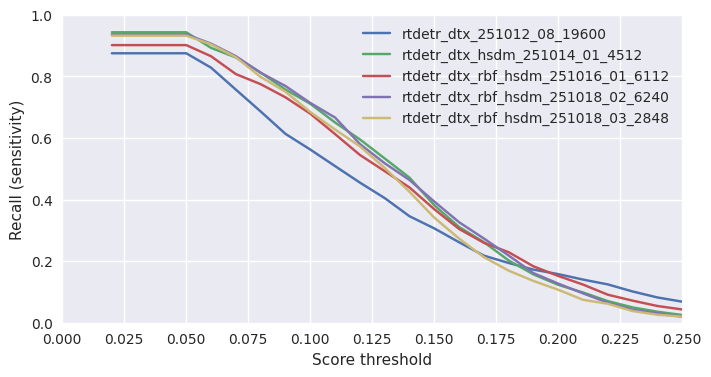

In [42]:
plt.style.use('seaborn-v0_8')
models = sorted(list(data_metric['model'].unique()))

fig, ax = plt.subplots(figsize=(8, 4))

for model in models:

    data_model = data_metric.loc[data_metric['model'] == model]
    checkpoint_list = sorted(data_model['checkpoint'].unique())

    # We pick the checkpoing with the largest recall at threshold 0.1
    data_model = data_model.sort_values(by=['score', metric], ascending=False)
    checkpoint = data_model.loc[data_model['score'] == 0.10, 'checkpoint'].tolist()[0]
    data_checkpoint = data_model.loc[data_model['checkpoint'] == checkpoint]

    x_data = data_checkpoint['score_threshold'].tolist()
    y_data = data_checkpoint[metric].tolist()
    
    ax.set(xlim=[0, 0.250], xticks=np.arange(0, 0.275, 0.025))
    ax.set(ylim=[0, 1.0], yticks=np.arange(0, 1.2, 0.2))
    ax.set(xlabel='Score threshold', ylabel='Recall (sensitivity)')
    
    ax.plot(x_data, y_data, label=f'{model}_{checkpoint}')
    ax.legend(loc='upper right')

recall_graph_name = f'models_hsdm_recall.png'
recall_graph_file = os.path.join(output_dir, recall_graph_name)

plt.savefig(recall_graph_file)
plt.show()

### Model ###

In [45]:
model_name = 'rtdetr_dtx_rbf_hsdm_251018_02'
model_dir = os.path.join(data_dir, 'model', model_name)

# Output directory
output_dir = os.path.join(os.environ['DATA'], 'output', model_name)
Path(output_dir).mkdir(parents=True, exist_ok=True)
print(f'Output directory: {output_dir}')

checkpoint_paths = glob.glob(os.path.join(model_dir, 'checkpoint-6240'))
checkpoint_numbers = [int(os.path.basename(checkpoint).split('-')[-1]) for checkpoint in checkpoint_paths]
checkpoint_dict = dict(zip(checkpoint_numbers, checkpoint_paths))
display(checkpoint_dict)

model_config_file = os.path.join(model_dir, f'{model_name}.json')
with open(model_config_file, mode='r') as file:
    model_config = json.load(file)
display(*list(model_config.keys()), sep='\n')

# Image processor
processor = DETRinference(device_name='cuda:0', 
                          checkpoint_path=checkpoint_paths[0]).processor

Output directory: /app/data_model/output/rtdetr_dtx_rbf_hsdm_251018_02


{6240: '/app/data_model/model/rtdetr_dtx_rbf_hsdm_251018_02/checkpoint-6240'}

'model_info'

'id2label'

'training_args'

'processor_params'

'bbox_format'

In [46]:
print(checkpoint_numbers)

[6240]


### PyTorch Dataset ###

In [47]:
# Create a PyTorch data set
transforms = AugmentationTransform().get_transforms(name='val')
bbox_format = model_config.get('bbox_format')
dataset = DETRdataset(data=df.copy(), 
                      image_processor=processor, 
                      image_dir=image_dir, 
                      file_name_col=file_col, 
                      label_id_col=None, 
                      bbox_col=None, 
                      bbox_format=bbox_format, 
                      transforms=transforms)
print(f'Total images in test data: {len(dataset)}')

# Convert the output image number id to the file name
file_name_list = [os.path.basename(file) for file in dataset.file_list]
id2file = dict(zip(range(len(file_name_list)), file_name_list))

# Convert the output category to the label (position)
id2label = {int(category_id): int(label) for category_id, label in model_config.get('id2label').items()}

# Add the data set labels to the data frame
dset_list = [list(df.loc[df[file_col] == file_name, dset_col].unique()) for file_name in file_name_list]
file2dset = dict(zip(file_name_list, dset_list))

Total images in test data: 639


### Predict bounding boxes on the test data for all checkpoints from this model ###

In [48]:
pred_file_name = f'{model_name}_hsdm_pred.parquet'
pred_file = os.path.join(output_dir, pred_file_name)
threshold = 0.05

if not os.path.exists(pred_file):

    print(f'No output file found. Running predictions for {len(checkpoint_numbers)} checkpoints.')

    # Run the forward pass to get the predictions for all checkpoints
    pred_raw_list = []
    for c, (checkpoint, checkpoint_path) in enumerate(checkpoint_dict.items()):
        print(f'Running checkpoint {checkpoint} {c + 1} / {len(checkpoint_dict)}')
        dtr = DETRinference(device_name='cuda:0', 
                            checkpoint_path=checkpoint_path,
                            batch_size=16)
        pred = dtr.predict_on_dataset(dataset, threshold=threshold)
        pred = pred.assign(checkpoint=checkpoint, pred_threshold=threshold)
        pred_raw_list.append(pred)
    
    pred_raw = pd.concat(pred_raw_list, axis=0, ignore_index=True).\
        sort_values(by='checkpoint', ascending=True).\
        reset_index(drop=True)
    
    # Make a copy of the predictions 
    pred = copy.deepcopy(pred_raw)
    
    # Add the file names to the data frame
    pred[file_col] = pred['image_id'].apply(lambda image_id: id2file.get(image_id))
    
    # Add the label names (the positions) to the data frame
    pred[label_col] = pred['category_id'].apply(lambda category_id: id2label.get(category_id))
    
    # Add the data sets for each image
    pred[dset_col] = pred[file_col].apply(lambda file_name: file2dset.get(file_name))

    # Let's find out if all of the images resulted in predictions
    pred_empty = len(pred.loc[pred[label_col].isnull(), file_col].unique())
    print(f'Images without predictions for threshold ({threshold}):{pred_empty}')
    
    # Filter out rows with images that do not have predictions
    pred = pred.loc[~pred[label_col].isnull()]
    
    # Save the predictions
    pred.to_parquet(pred_file)
    print(f'Saved output to file: {pred_file}')

else:
    
    print(f'Loading from file: {pred_file}')
    pred = pd.read_parquet(pred_file)

print(f'Total number of images in data set:             {len(dataset)}')
print(f'Images with predictions:                        {len(pred[file_col].unique())}')

Loading from file: /app/data_model/output/rtdetr_dtx_rbf_hsdm_251018_02/rtdetr_dtx_rbf_hsdm_251018_02_hsdm_pred.parquet
Total number of images in data set:             639
Images with predictions:                        639


In [49]:
print(pred['checkpoint'].unique())

[ 6240 19104 19136 19168 19200]


### Classify predictions: TP, FP, FN ###
We create a method to classify all of the predictions in the data set. 

In [51]:
true_df = copy.deepcopy(df)
pred_df = copy.deepcopy(pred)
display(pred_df.head(2))

,image_id,image_width,image_height,batch,category_id,bbox,score,area,checkpoint,pred_threshold,file_name,pos,dset
0,0,1200,854,0,14,"[602, 0, 588, 289]",0.222831,169932,6240,0.05,0060bce2_20210430_02.png,15.0,[val]
1,424,2400,1708,26,19,"[698, 52, 1701, 1157]",0.060393,1968057,6240,0.05,a2371ee0_20230223_03.png,20.0,[val]


In [52]:
pr_df_list = []
ap_df_list = []

iou_list = [0.25, 0.5, 0.7]

for checkpoint in checkpoint_numbers:
    
    pred_df_checkpoint = pred_df.loc[pred_df['checkpoint'] == checkpoint]
    
    # Set up the metrics instance
    metrics = DetectionMetrics(
    true_df=true_df,
    pred_df=pred_df_checkpoint,
    file_col=file_col,
    label_col=label_col,
    bbox_col=bbox_col,
    score_col=score_col)

    for iou_threshold in iou_list:
    
        # Classify the predictions
        classifications, missed = metrics.classify_predictions_df(iou_threshold=iou_threshold)
        pr_df = metrics.ap_from_classifications(classifications=classifications)
        pr_df.insert(loc=0, column='model', value=model_name)
        pr_df.insert(loc=1, column='dataset', value=dataset_name)
        pr_df.insert(loc=2, column='checkpoint', value=checkpoint)
        pr_df.insert(loc=3, column='score_threshold', value=threshold)
        pr_df_list.append(pr_df)
        
        # Get the AUC values
        ap_df = pr_df[[label_col, 'iou_threshold', 'auc', file_col]].\
            groupby([label_col, 'iou_threshold', 'auc']).nunique().\
            reset_index(drop=False).\
            rename(columns={file_col: 'n_predictions'}).\
            sort_values(by=label_col, ascending=True).\
            reset_index(drop=True)
        ap_df.insert(loc=0, column='model', value=model_name)
        ap_df.insert(loc=1, column='dataset', value=dataset_name)
        ap_df.insert(loc=2, column='checkpoint', value=checkpoint)
        ap_df.insert(loc=3, column='score_threshold', value=threshold)
        print(f'mAP for checkpoint {checkpoint} at IoU({iou_threshold}): {ap_df['auc'].mean(): .3f}')
        ap_df_list.append(ap_df)

mAP for checkpoint 6240 at IoU(0.25):  0.246
mAP for checkpoint 6240 at IoU(0.5):  0.151
mAP for checkpoint 6240 at IoU(0.7):  0.011


In [54]:
# Save the output
precision_recall_df = pd.concat(pr_df_list, axis=0, ignore_index=True)
average_precision_df = pd.concat(ap_df_list, axis=0, ignore_index=True)

pr_data_name = f'{model_name}_hsdm_PR.parquet'
pr_data_file = os.path.join(output_dir, pr_data_name)
# precision_recall_df.to_parquet(pr_data_file)
print(f'Saved Precision-Recall data: {pr_data_file}')

ap_data_name = f'{model_name}_hsdm_AUC.parquet'
ap_data_file = os.path.join(output_dir, ap_data_name)
# average_precision_df.to_parquet(ap_data_file)
print(f'Saved Average Precision data: {ap_data_file}')

display(precision_recall_df.head(2))
display(average_precision_df.head(2))

Saved Precision-Recall data: /app/data_model/output/rtdetr_dtx_rbf_hsdm_251018_02/rtdetr_dtx_rbf_hsdm_251018_02_hsdm_PR.parquet
Saved Average Precision data: /app/data_model/output/rtdetr_dtx_rbf_hsdm_251018_02/rtdetr_dtx_rbf_hsdm_251018_02_hsdm_AUC.parquet


,model,dataset,checkpoint,score_threshold,file_name,iou_threshold,score,bbox,pos,TP,IoU,n_missed,duplicate_TP,precision,recall,precision_label,recall_label,auc
0,rtdetr_dtx_rbf_hsdm_251018_02,dataset_object_240921,6240,0.05,4d47eb4b_20230131_00.png,0.25,0.181385,"[200, 5, 789, 1018]",1.0,0,NaN,0,False,NaN,NaN,NaN,NaN,NaN
1,rtdetr_dtx_rbf_hsdm_251018_02,dataset_object_240921,6240,0.05,7d05af8e_20210517_16.png,0.25,0.180179,"[9, 391, 1088, 821]",1.0,0,NaN,0,False,NaN,NaN,NaN,NaN,NaN


,model,dataset,checkpoint,score_threshold,pos,iou_threshold,auc,n_predictions
0,rtdetr_dtx_rbf_hsdm_251018_02,dataset_object_240921,6240,0.05,2.0,0.25,0.318905,126
1,rtdetr_dtx_rbf_hsdm_251018_02,dataset_object_240921,6240,0.05,3.0,0.25,0.336790,126


### Image-level results: precision - recall for labeled objects ###

In [55]:
#min_score = 0.17
cl_list = sorted(df[label_col].unique())
score_threshold_list = np.arange(0.020, 0.5, 0.010)
iou_threshold = 0.25

result_df_list = []
# LOOP OVER THE CHECKPOINTS OF THE MODEL
for ck, checkpoint in enumerate(checkpoint_numbers):
    
    print(f'Checkpoint {ck + 1} / {len(checkpoint_numbers)}')

    prdata = copy.deepcopy(precision_recall_df)
    prdata = prdata.loc[
        (prdata['checkpoint'] == checkpoint) & 
        (prdata['iou_threshold'] == iou_threshold)]
    
    # LOOP OVER ALL CLASSES
    for c, cl in enumerate(cl_list):
    
        if (c + 1) % 10 == 0:
            print(f'Label {c + 1} / {len(cl_list)}')
    
        # Images with labels for that class
        true_cl_images = sorted(list(df.loc[df[label_col] == cl, file_col].unique()))
        
        if len(true_cl_images) > 0:
    
            # Count the predictions for different thresholds
            for m, min_score in enumerate(score_threshold_list):
        
                # Check each images if the class was predicted
                predicted_cl = []
                total_predictions_cl = []
                
                for file_name in true_cl_images:
                
                    # Check im the class is in the prediction for the given treshold
                    pr_cl_list = prdata.loc[
                        (prdata[file_col] == file_name) &
                        (prdata[label_col] == cl) &
                        (prdata[score_col] >= min_score), 
                        label_col].tolist()
                    
                    prediction = 0 # FN: the class was missed in this image
                    
                    if len(pr_cl_list) > 0:
                        # The class was predicted in this image
                        prediction = 1
        
                    total_predictions_cl.append(len(pr_cl_list))
                    predicted_cl.append(prediction)
                
                # Confusion matrix
                total_cl = sum(total_predictions_cl)
                n_cl = len(predicted_cl)
                FP_cl = total_cl - n_cl # multiple predictions
                TP_cl = sum(predicted_cl)
                FN_cl = n_cl - TP_cl # prediction=0
                RC_cl = np.around(TP_cl / n_cl, decimals=3)
        
                result_cl = {'model': model_name, 
                             'checkpoint': checkpoint,
                             'score_threshold': min_score,
                             label_col: cl,
                             'n_true_images': n_cl,
                             'total_preds': total_cl,
                             'mulitples': FP_cl,
                             'TP': TP_cl,
                             'FN': FN_cl,
                             'recall': RC_cl}
            
                result_df_list.append(pd.DataFrame(result_cl, index=[c]))
    
result_df = pd.concat(result_df_list, axis=0)

# Save the recall table
rc_data_name = f'{model_name}_hsdm_RECALL.parquet'
rc_data_file = os.path.join(output_dir, rc_data_name)
# result_df.to_parquet(rc_data_file)
print(f'Saved recall results: {rc_data_file}')

Checkpoint 1 / 1
Label 10 / 31
Label 20 / 31
Label 30 / 31
Saved recall results: /app/data_model/output/rtdetr_dtx_rbf_hsdm_251018_02/rtdetr_dtx_rbf_hsdm_251018_02_hsdm_RECALL.parquet


In [57]:
metric = 'recall'
label_list = sorted(list(result_df['pos'].unique()))

data_metric = result_df[['checkpoint', 'score_threshold', metric]].\
    groupby(['checkpoint', 'score_threshold']).mean().\
    reset_index(drop=False).\
    sort_values(by=['checkpoint', 'score_threshold'], ascending=True).\
    reset_index(drop=True)

display(data_metric.sample(5))

,checkpoint,score_threshold,recall
6,6240,0.08,0.811581
30,6240,0.32,0.002000
28,6240,0.30,0.004000
2,6240,0.04,0.936161
34,6240,0.36,0.000000


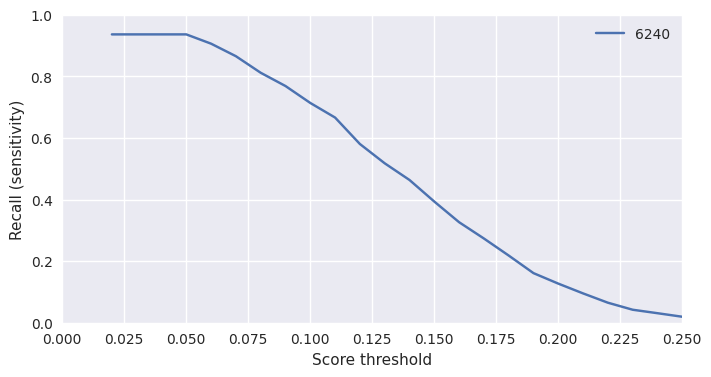

In [58]:
plt.style.use('seaborn-v0_8')
checkpoints = sorted(list(data_metric['checkpoint'].unique()))

fig, ax = plt.subplots(figsize=(8, 4))

for checkpoint in checkpoints:

    data_checkpoint = data_metric.loc[data_metric['checkpoint'] == checkpoint]

    x_data = data_checkpoint['score_threshold'].tolist()
    y_data = data_checkpoint[metric].tolist()
    
    ax.set(xlim=[0, 0.250], xticks=np.arange(0, 0.275, 0.025))
    ax.set(ylim=[0, 1.0], yticks=np.arange(0, 1.2, 0.2))
    ax.set(xlabel='Score threshold', ylabel='Recall (sensitivity)')
    
    ax.plot(x_data, y_data, label=checkpoint)
    ax.legend(loc='upper right')

recall_graph_name = f'{model_name}_hsdm_recall.png'
recall_graph_file = os.path.join(output_dir, recall_graph_name)

plt.savefig(recall_graph_file)
plt.show()

### Visualizations: bounding boxes ###

In [59]:
checkpoint = 6240
min_score = 0.1
iou_threshold = 0.25

pr_df = precision_recall_df.loc[
    (precision_recall_df['checkpoint'] == checkpoint) & 
    (precision_recall_df['iou_threshold'] == iou_threshold) *
    (precision_recall_df[score_col] >= min_score)]

file_list = sorted(list(pr_df[file_col].unique()))
random.shuffle(file_list)
show_n_images = 100

output_images_dir = os.path.join(output_dir, 'images', f'checkpoint_{checkpoint}')
Path(output_images_dir).mkdir(parents=True, exist_ok=True)
print(f'Total number of images in data: {len(file_list)}')

Total number of images in data: 634


IMAGE 1 / 634


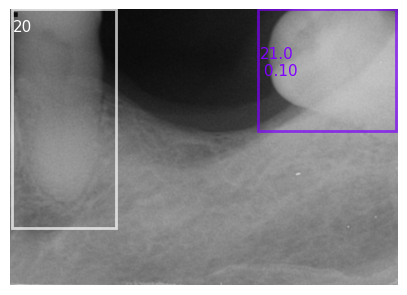

IMAGE 2 / 634


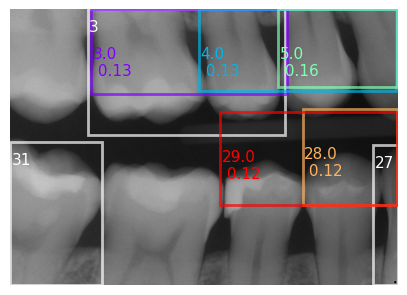

IMAGE 3 / 634


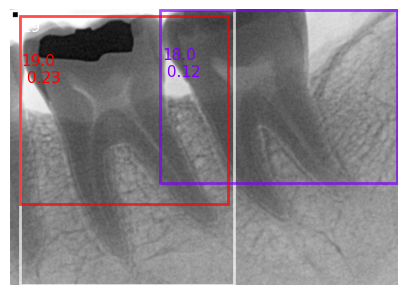

IMAGE 4 / 634


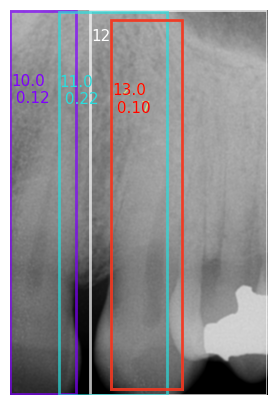

IMAGE 5 / 634


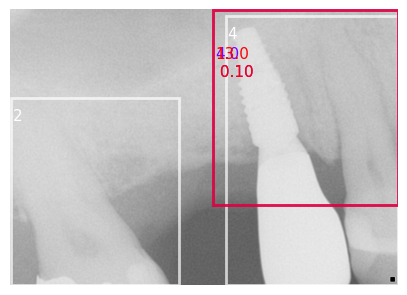

IMAGE 6 / 634


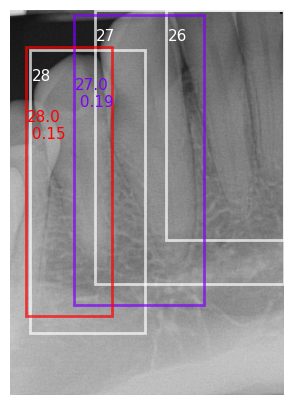

IMAGE 7 / 634


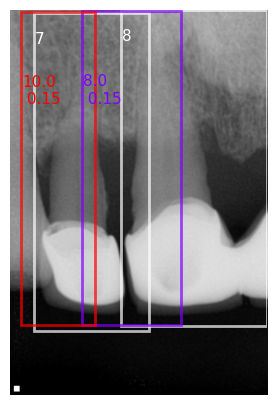

IMAGE 8 / 634


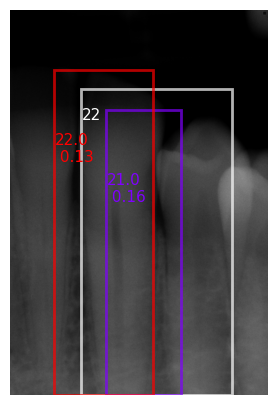

IMAGE 9 / 634


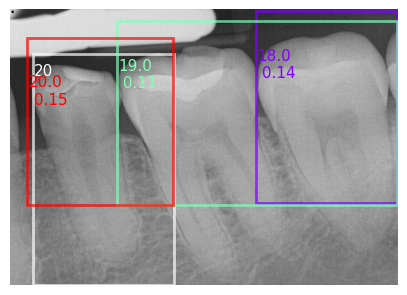

IMAGE 10 / 634


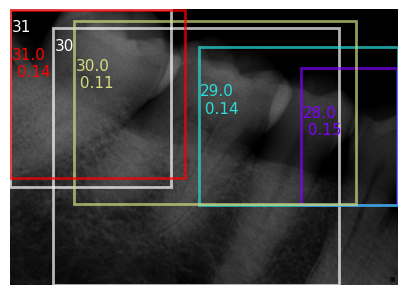

IMAGE 11 / 634


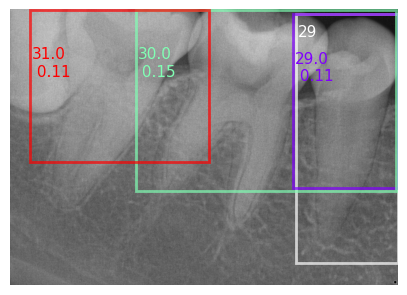

IMAGE 12 / 634


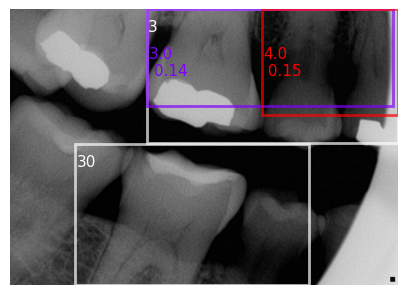

IMAGE 13 / 634


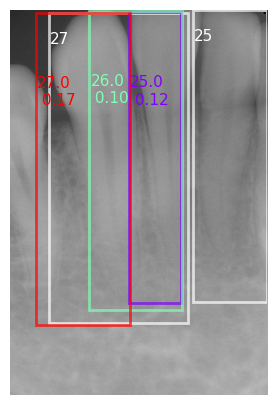

IMAGE 14 / 634


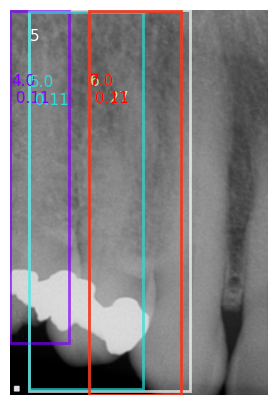

IMAGE 15 / 634


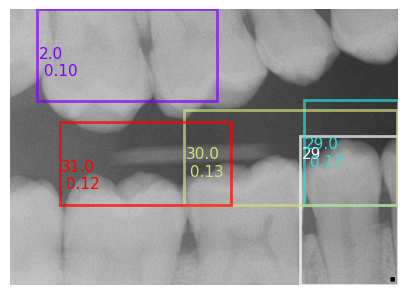

IMAGE 16 / 634


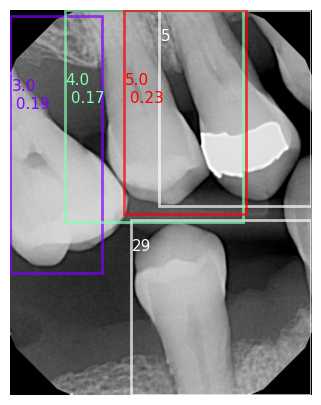

IMAGE 17 / 634


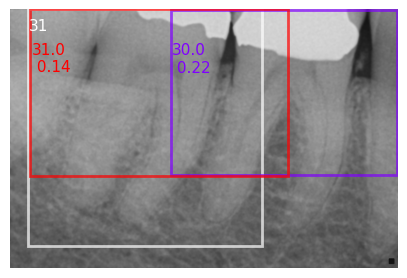

IMAGE 18 / 634


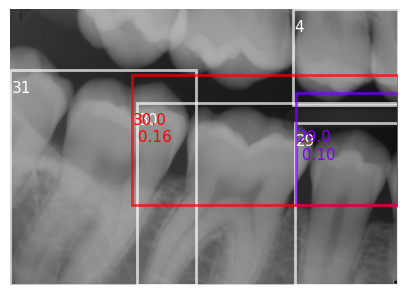

IMAGE 19 / 634


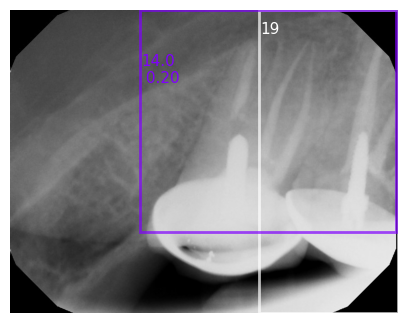

IMAGE 20 / 634


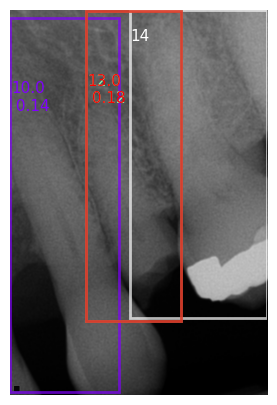

IMAGE 21 / 634


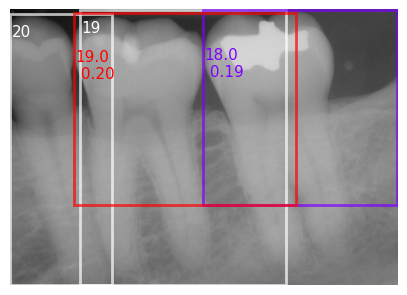

IMAGE 22 / 634


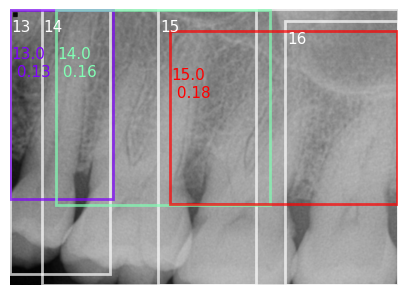

IMAGE 23 / 634


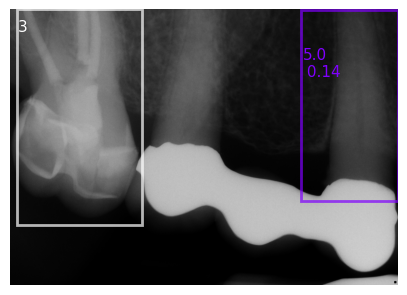

IMAGE 24 / 634


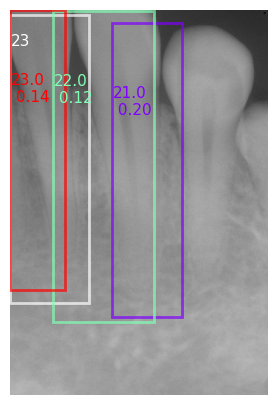

IMAGE 25 / 634


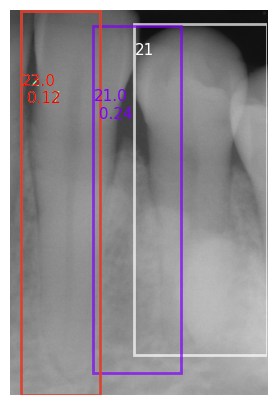

IMAGE 26 / 634


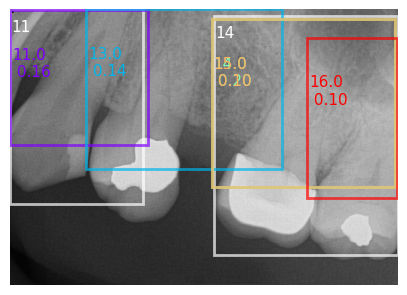

IMAGE 27 / 634


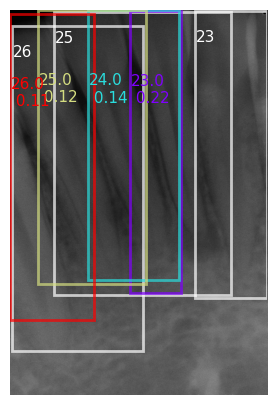

IMAGE 28 / 634


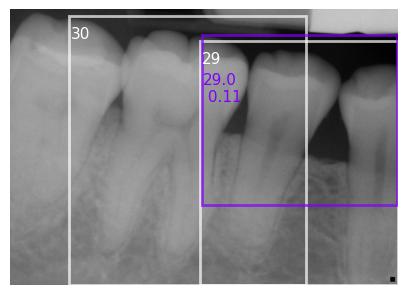

IMAGE 29 / 634


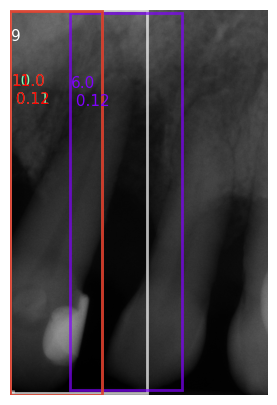

IMAGE 30 / 634


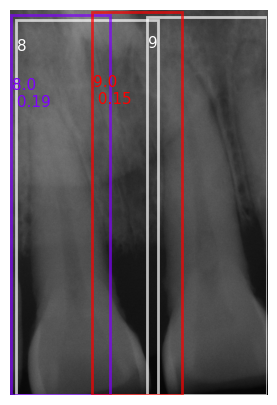

IMAGE 31 / 634


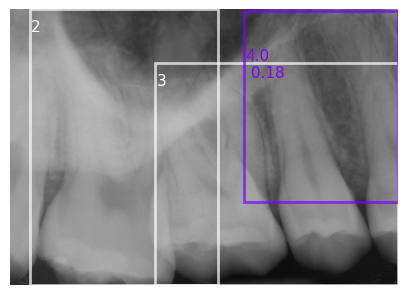

IMAGE 32 / 634


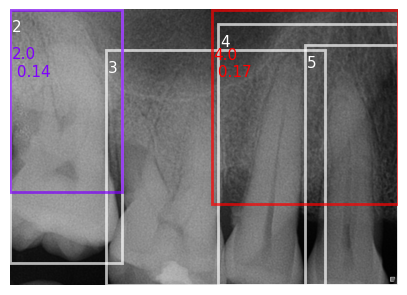

IMAGE 33 / 634


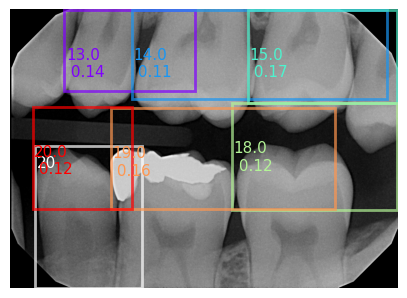

IMAGE 34 / 634


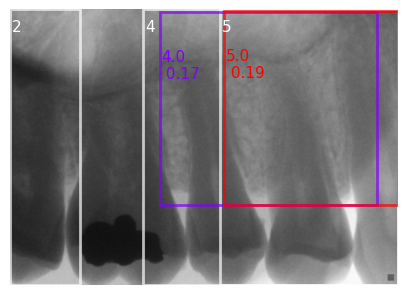

IMAGE 35 / 634


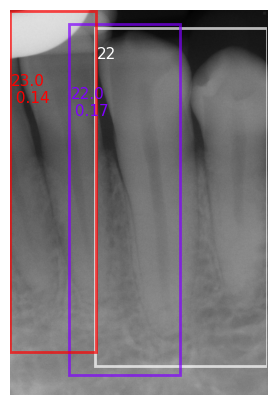

IMAGE 36 / 634


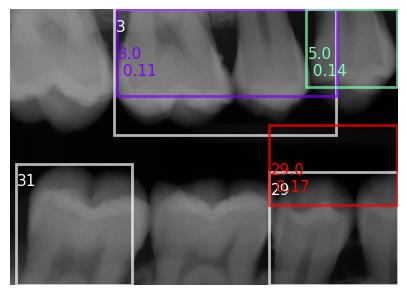

IMAGE 37 / 634


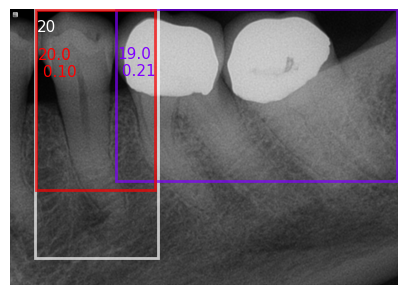

IMAGE 38 / 634


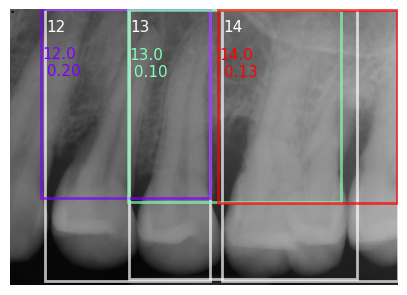

IMAGE 39 / 634


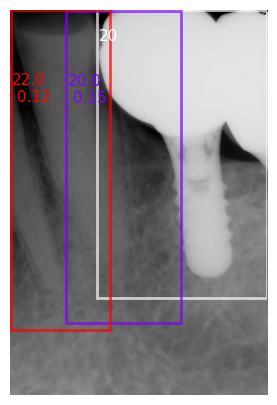

IMAGE 40 / 634


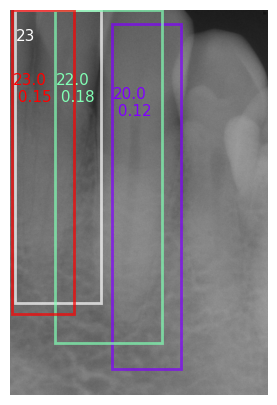

IMAGE 41 / 634


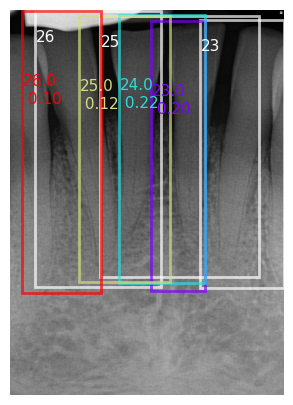

IMAGE 42 / 634


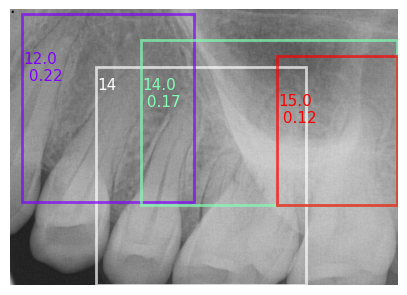

IMAGE 43 / 634


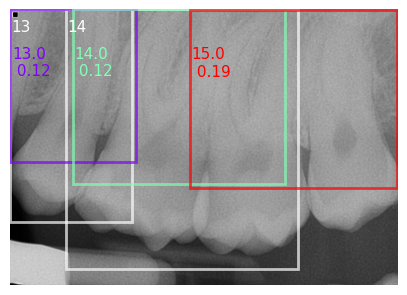

IMAGE 44 / 634


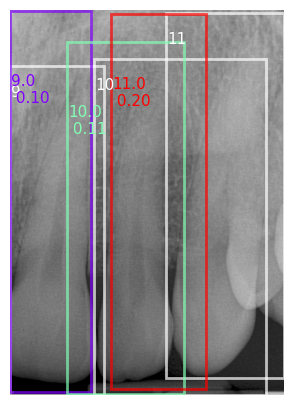

IMAGE 45 / 634


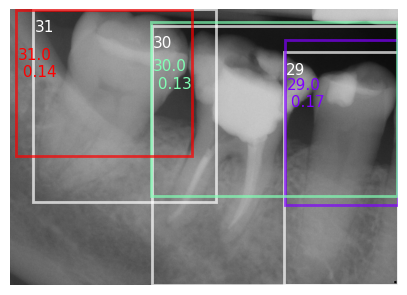

IMAGE 46 / 634


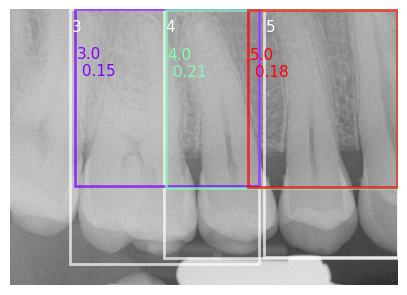

IMAGE 47 / 634


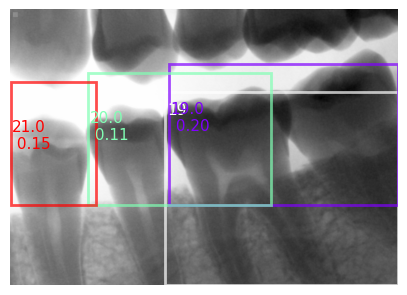

IMAGE 48 / 634


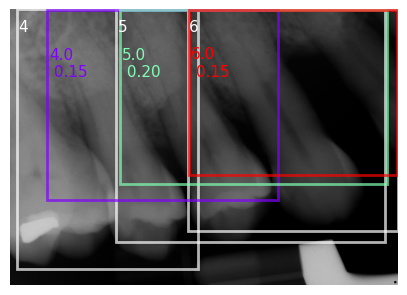

IMAGE 49 / 634


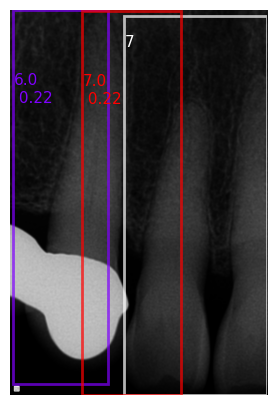

IMAGE 50 / 634


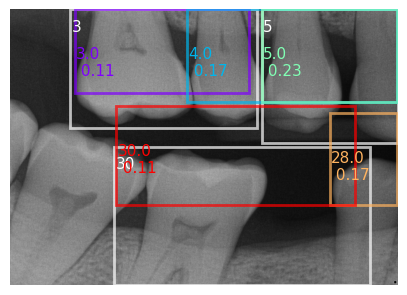

IMAGE 51 / 634


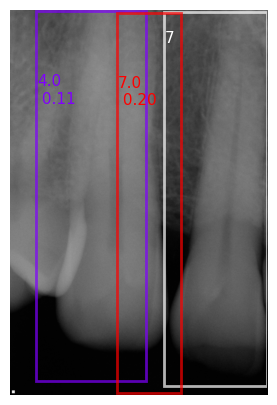

IMAGE 52 / 634


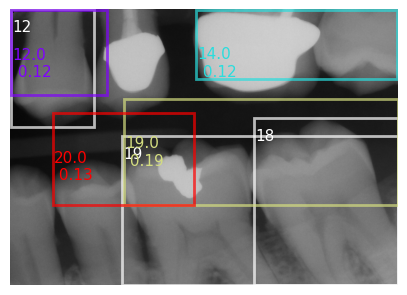

IMAGE 53 / 634


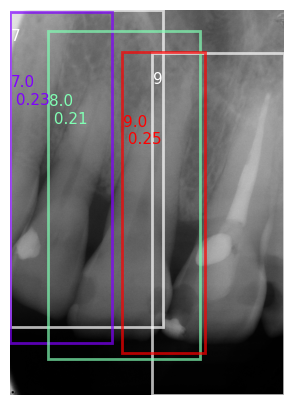

IMAGE 54 / 634


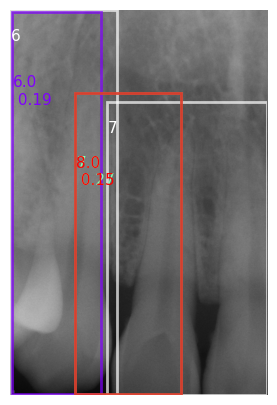

IMAGE 55 / 634


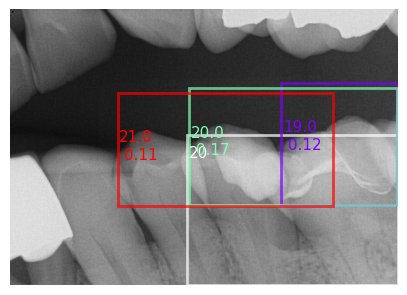

IMAGE 56 / 634


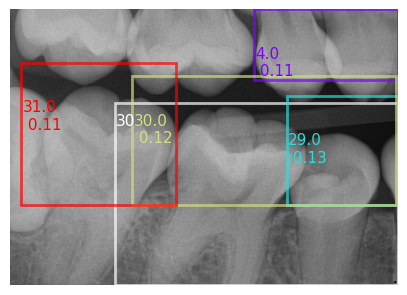

IMAGE 57 / 634


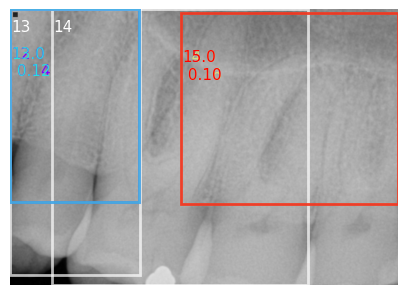

IMAGE 58 / 634


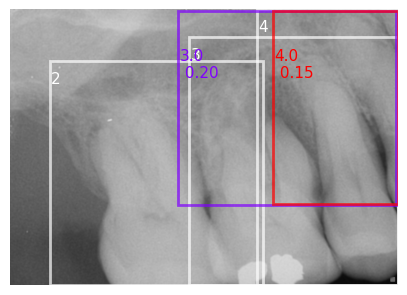

IMAGE 59 / 634


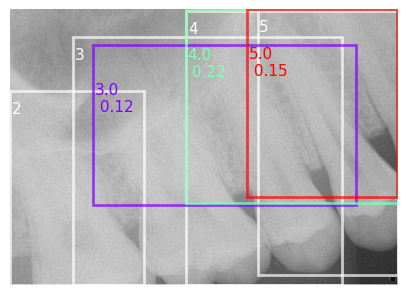

IMAGE 60 / 634


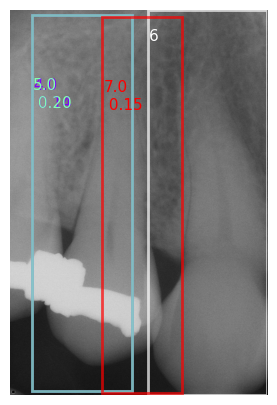

IMAGE 61 / 634


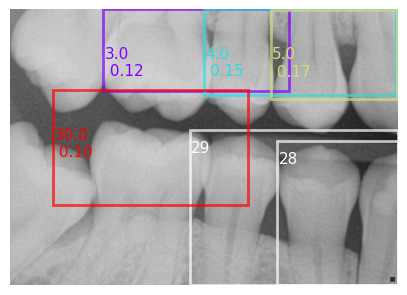

IMAGE 62 / 634


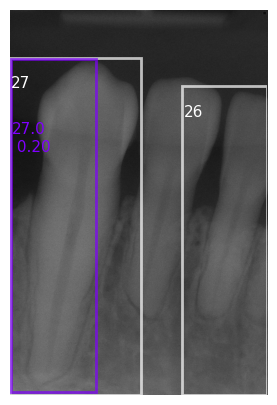

IMAGE 63 / 634


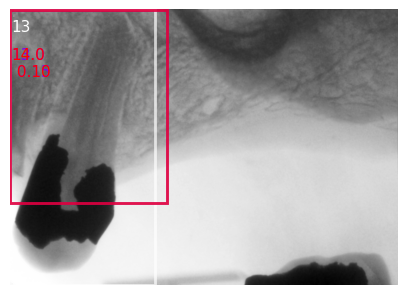

IMAGE 64 / 634


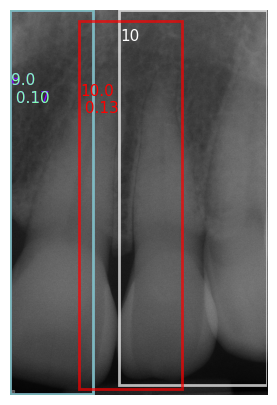

IMAGE 65 / 634


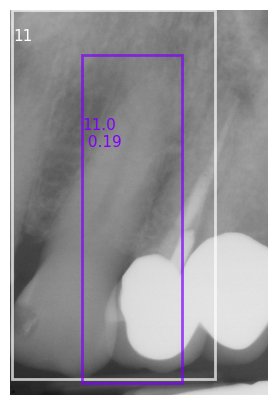

IMAGE 66 / 634


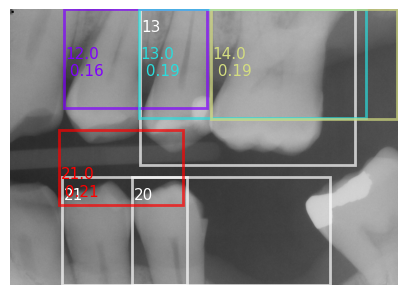

IMAGE 67 / 634


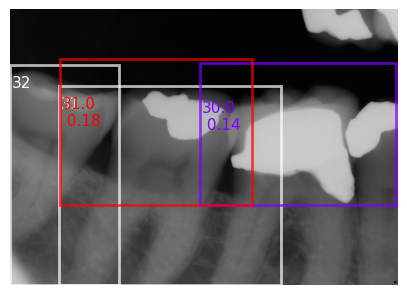

IMAGE 68 / 634


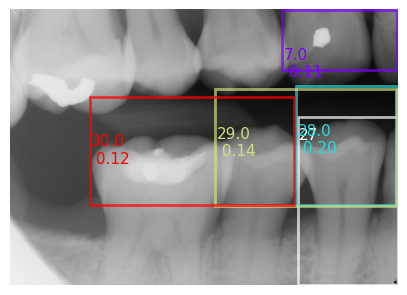

IMAGE 69 / 634


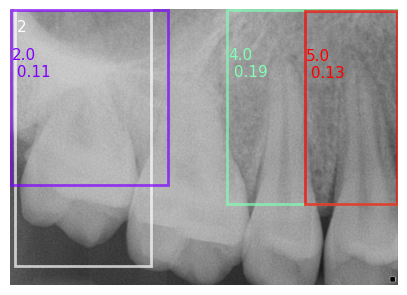

IMAGE 70 / 634


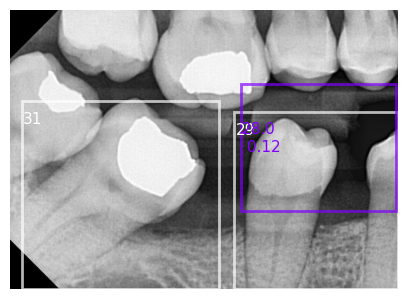

IMAGE 71 / 634


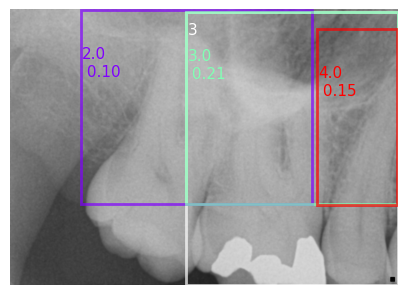

IMAGE 72 / 634


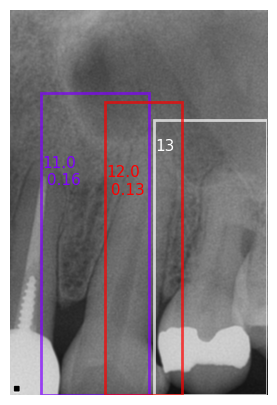

IMAGE 73 / 634


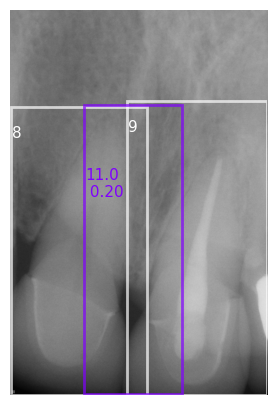

IMAGE 74 / 634


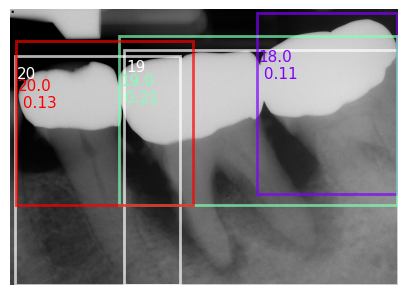

IMAGE 75 / 634


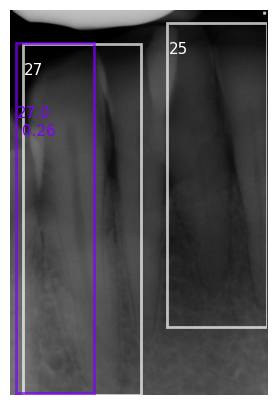

IMAGE 76 / 634


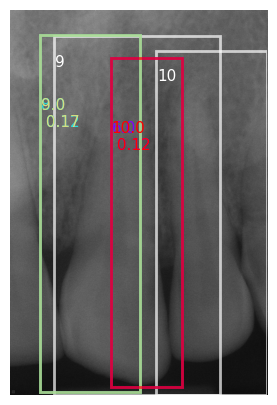

IMAGE 77 / 634


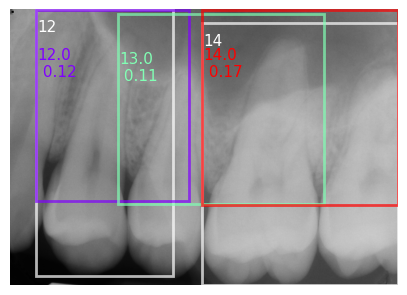

IMAGE 78 / 634


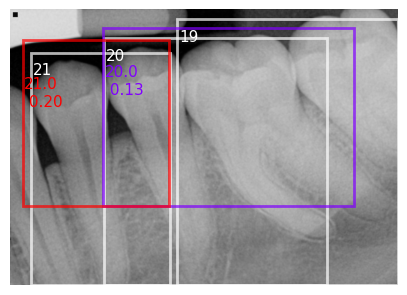

IMAGE 79 / 634


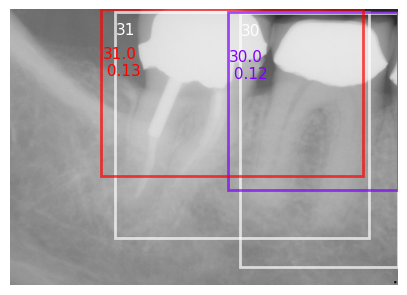

IMAGE 80 / 634


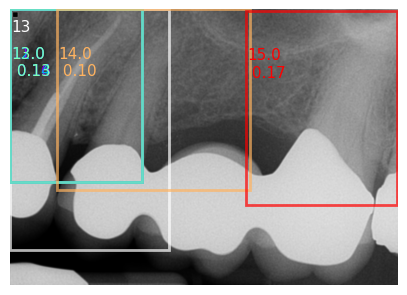

IMAGE 81 / 634


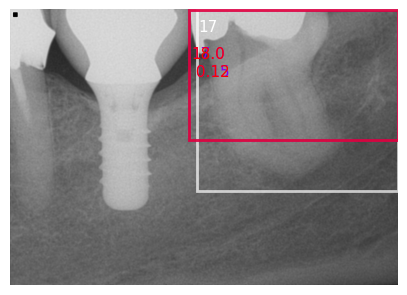

IMAGE 82 / 634


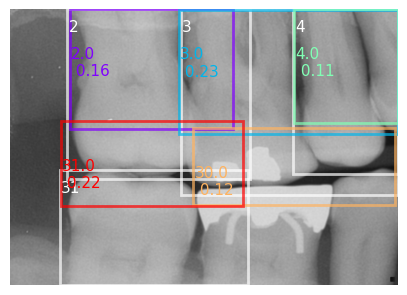

IMAGE 83 / 634


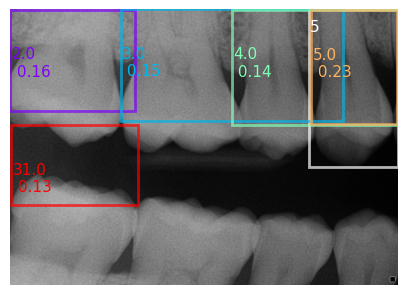

IMAGE 84 / 634


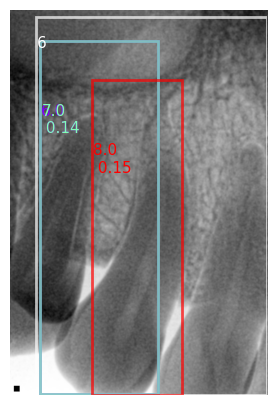

IMAGE 85 / 634


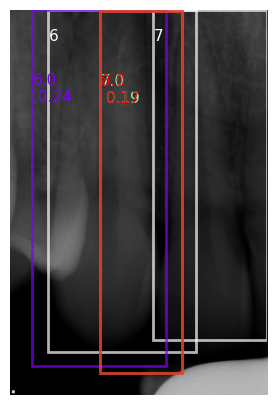

IMAGE 86 / 634


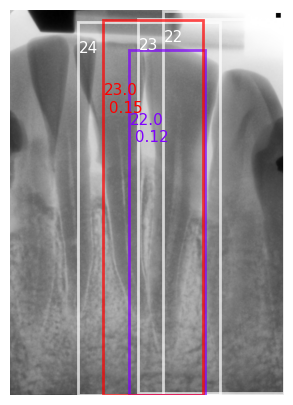

IMAGE 87 / 634


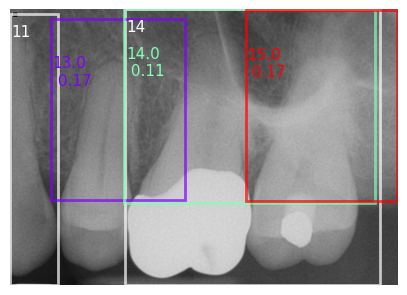

IMAGE 88 / 634


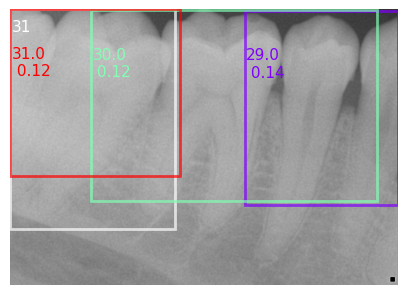

IMAGE 89 / 634


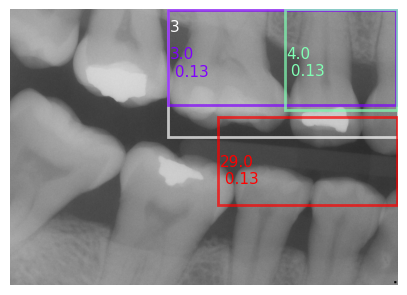

IMAGE 90 / 634


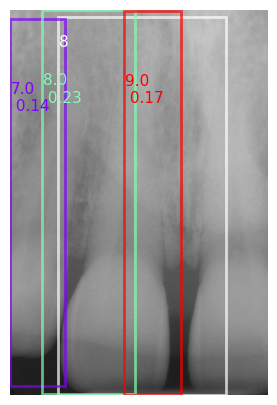

IMAGE 91 / 634


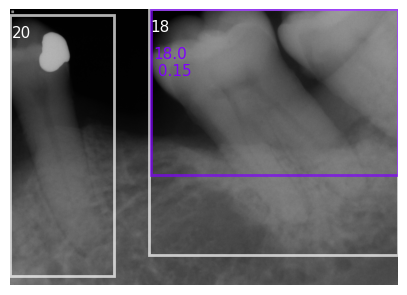

IMAGE 92 / 634


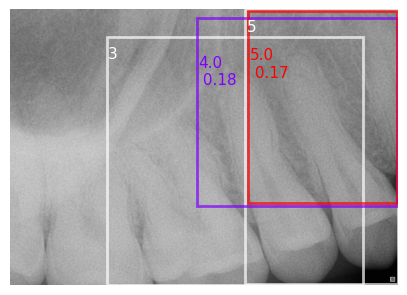

IMAGE 93 / 634


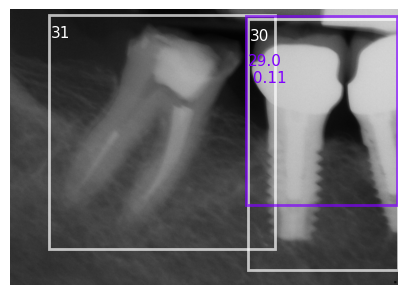

IMAGE 94 / 634


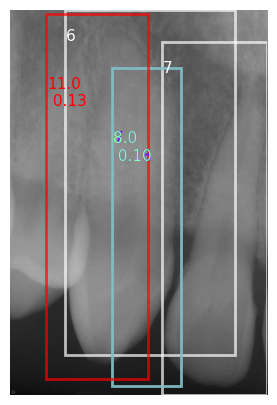

IMAGE 95 / 634


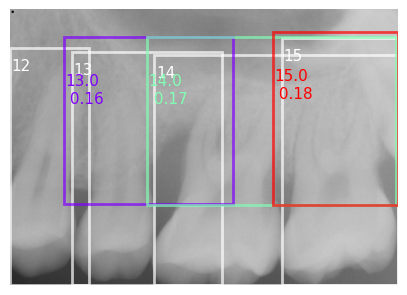

IMAGE 96 / 634


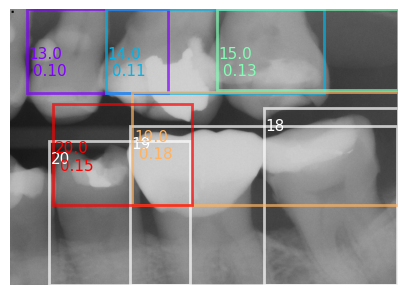

IMAGE 97 / 634


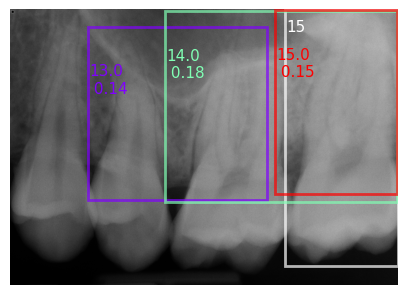

IMAGE 98 / 634


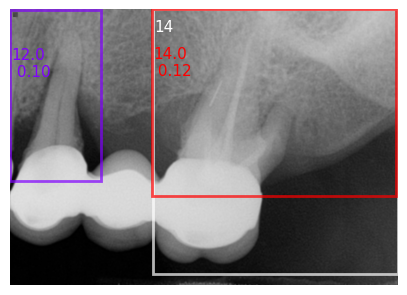

IMAGE 99 / 634


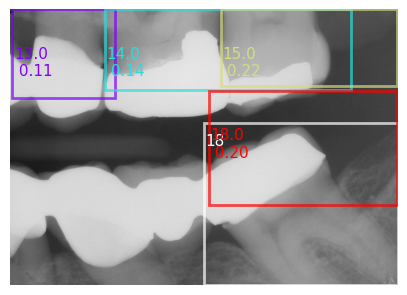

IMAGE 100 / 634


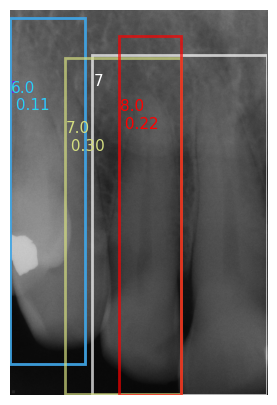

In [60]:
for f, file_name in enumerate(file_list[:show_n_images]):

    print(f'IMAGE {f + 1} / {len(file_list)}')
    
    file = os.path.join(image_dir, file_name)
    im = ImageData().load_image(file)
    im = ImageData().np2color(im)
    # im = ImageData().hist_eq(im)
    
    # Create a file name to save the image
    im_file_name = f'{model_name}_{checkpoint}_{os.path.splitext(file_name)[0]}.png'
    im_file = os.path.join(output_images_dir, im_file_name)
    
    pr_file = pr_df.loc[(pr_df[file_col] == file_name)]
    # Take the prediction with the higher score if there is more than one
    pr_file = pr_file.sort_values(by=[label_col, score_col], ascending=False).\
        groupby(label_col).first().\
        reset_index(drop=False)
    
    pr_bbox_list = pr_file[bbox_col].tolist()
    pr_pos_list = pr_file[label_col].tolist()
    pr_score_list = pr_file[score_col].tolist()
    pr_label_list = [f'{pos}\n{score: .2f}' for pos, score in zip(pr_pos_list, pr_score_list)]
    
    df_file = df.loc[df[file_col] == file_name]
    df_bbox_list = df_file[bbox_col].tolist()
    df_pos_list = df_file[label_col].tolist()
    
    fig, ax = plt.subplots(figsize=(5, 5))
    
    ax = plot_boxes(image=im, 
                    box_list=df_bbox_list, 
                    label_list=df_pos_list, 
                    ax=ax, 
                    color='w', 
                    linewidth=2.0, 
                    fontsize=11)
    
    ax = plot_boxes(image=im, 
                    box_list=pr_bbox_list, 
                    label_list=pr_label_list, 
                    ax=ax, 
                    offset_xy=(0, 200), 
                    linewidth=2.0, 
                    fontsize=11)
    
    plt.savefig(im_file, bbox_inches='tight')
    plt.show()

### Visualizations: PR Curves ###

In [22]:
min_score = 0.1
iou_threshold = 0.5
pr_df = precision_recall_df.loc[precision_recall_df['checkpoint'] == checkpoint]
iou_list = sorted(list(pr_df['iou_threshold'].unique()))
print(iou_list)

plt.style.use('seaborn-v0_8')
cmap = plt.cm.Blues
num_colors = len(iou_list) + 1
colors = [cmap(i) for i in np.linspace(0.6, 1, num_colors)]

output_pr_dir = os.path.join(output_dir, 'pr')
Path(output_pr_dir).mkdir(parents=True, exist_ok=True)

[0.25, 0.5, 0.7]


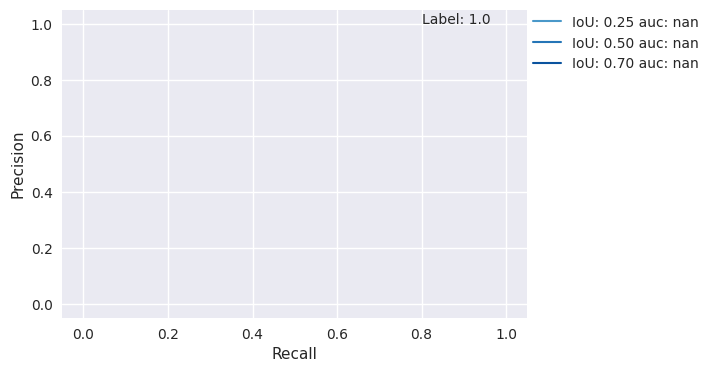

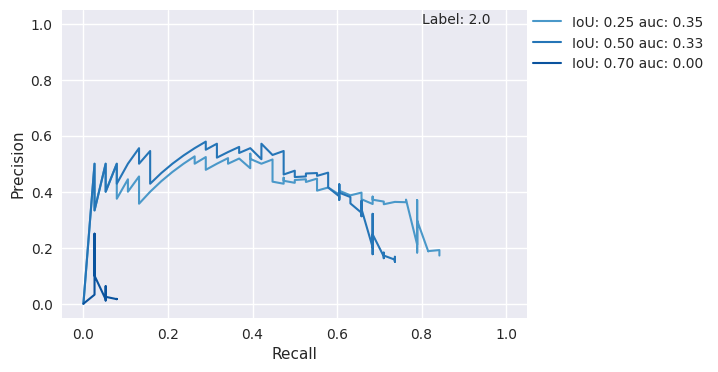

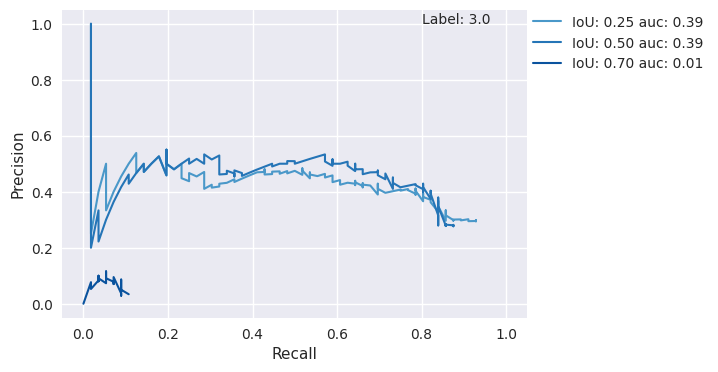

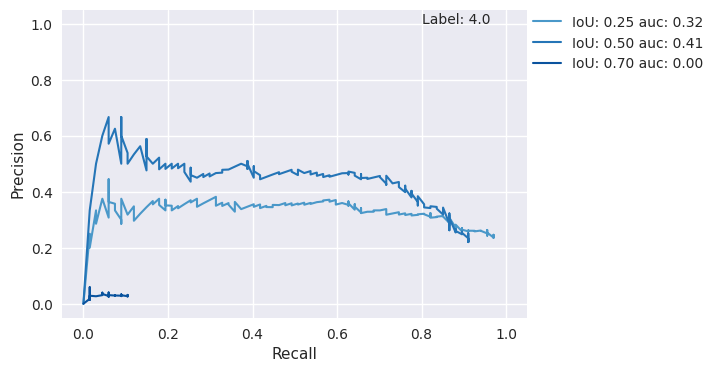

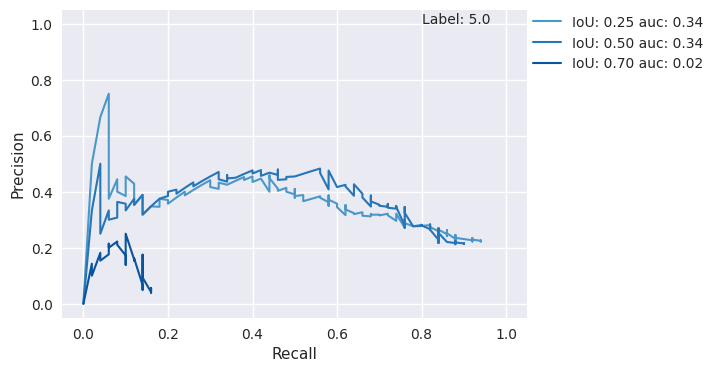

...

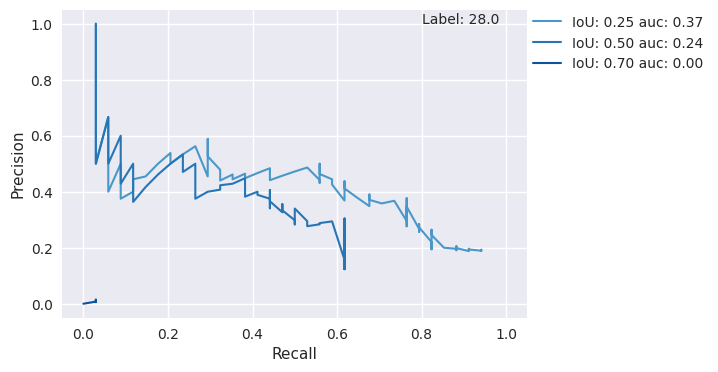

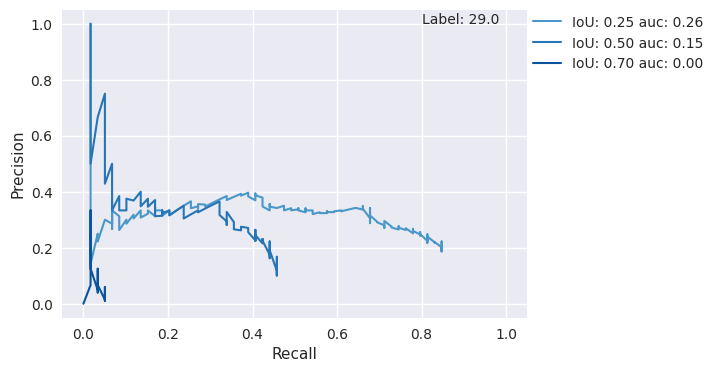

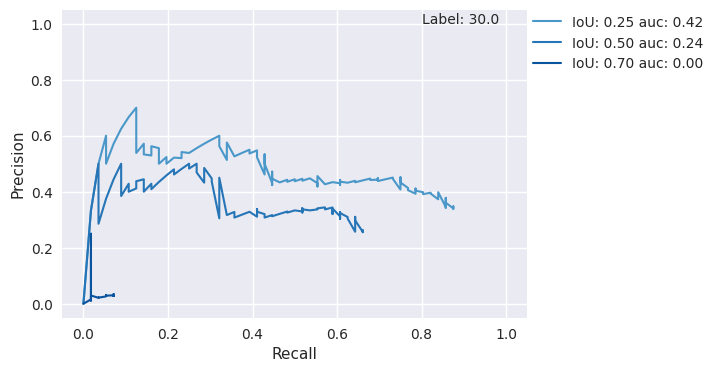

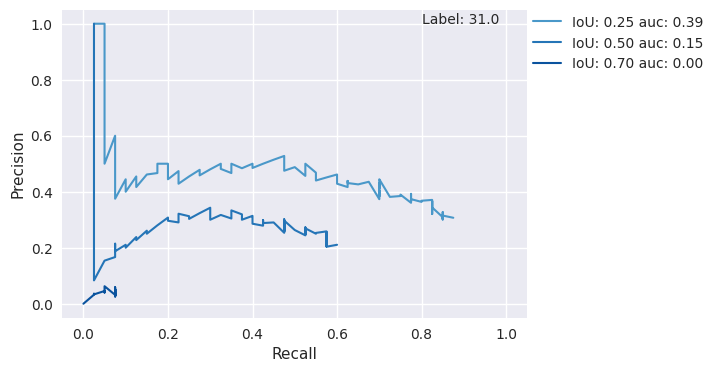

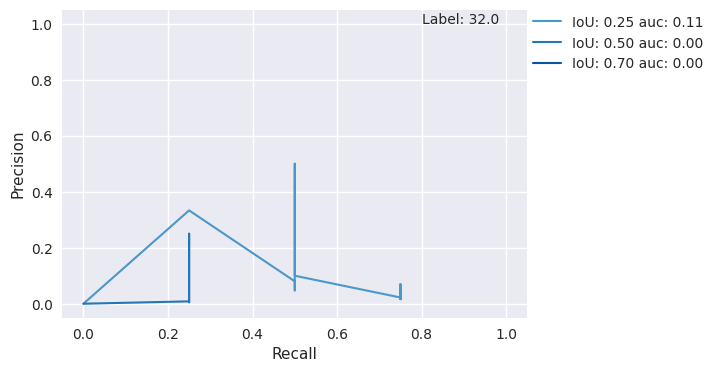

In [23]:
label_list = sorted(list(pr_df[label_col].unique()))

for label in label_list:

    # l = 10
    # label = label_list[l]
    
    fig_file_name = f'{model_name}_{str(label).zfill(2)}.png'
    fig_file = os.path.join(output_pr_dir, fig_file_name)
    
    fig, ax = plt.subplots(figsize=(6, 4))
    
    for c, iou in enumerate(iou_list):
    
        pr_df_label = pr_df.loc[
                (pr_df[label_col] == label) & 
                (pr_df['iou_threshold'] == iou)].\
            sort_values(by='recall', ascending=True).\
            reset_index(drop=True)
        
        prec = pr_df_label['precision'].tolist()
        rec = pr_df_label['recall'].tolist()
        auc = skmetrics.auc(x=rec, y=prec)
        graph_label = f'IoU:{iou: .2f} auc:{auc: .2f}'
        
        ax.plot(rec, prec, linewidth=1.5, label=graph_label, color=colors[c])
        
        ax.set(xlim=[-0.05, 1.05], xticks=np.arange(0, 1.2, 0.2),
               ylim=[-0.05, 1.05], yticks=np.arange(0, 1.2, 0.2),
               xlabel='Recall', ylabel='Precision')
    
        ax.legend(bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0.)
        
    ax.text(x=0.80, y=1.0, s=f'Label: {str(label).zfill(2)}', size=10)
    plt.savefig(fig_file, bbox_inches='tight')
    plt.show()